In [1]:
# Python libraries
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, learning_curve, train_test_split
from sklearn.metrics import precision_score, roc_auc_score, recall_score, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

warnings.filterwarnings('ignore')

In [2]:
#read excel file in a dataframe
dataset = pd.ExcelFile ('Hash-Analytic-Python-Analytics-Problem-case-study-1.xlsx')
worksheets = dataset.sheet_names
print('All the worksheets', worksheets) 

All the worksheets ['INFO', 'Existing employees', 'Employees who have left', 'Presentation']


In [3]:
df1 = pd.read_excel(dataset, 'Existing employees')
df2 = pd.read_excel(dataset, 'Employees who have left')
df3 = pd.read_excel(dataset, 'INFO')

In [4]:
#Existing Employess worksheet
df1.columns

Index(['Emp ID', 'satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident',
       'promotion_last_5years', 'dept', 'salary'],
      dtype='object')

In [5]:
#Employees who have left worksheet
df2.columns

Index(['Emp ID', 'satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident',
       'promotion_last_5years', 'dept', 'salary'],
      dtype='object')

In [6]:
df3.columns

Index(['The data is for company X which is trying to control attrition. There are two sets of data: "Existing employees" and "Employees who have left". Following attributes are available for every employee.'], dtype='object')

In [7]:
df1.head()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dept,salary
0,2001,0.58,0.74,4,215,3,0,0,sales,low
1,2002,0.82,0.67,2,202,3,0,0,sales,low
2,2003,0.45,0.69,5,193,3,0,0,sales,low
3,2004,0.78,0.82,5,247,3,0,0,sales,low
4,2005,0.49,0.60,3,214,2,0,0,sales,low


In [8]:
df2.head()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dept,salary
0,1,0.38,0.53,2,157,3,0,0,sales,low
1,2,0.80,0.86,5,262,6,0,0,sales,medium
2,3,0.11,0.88,7,272,4,0,0,sales,medium
3,4,0.72,0.87,5,223,5,0,0,sales,low
4,5,0.37,0.52,2,159,3,0,0,sales,low


In [9]:
df1.shape

(11428, 10)

In [10]:
df2.shape

(3571, 10)

In [11]:
df1.isnull().sum() #no null values

Emp ID                   0
satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
promotion_last_5years    0
dept                     0
salary                   0
dtype: int64

In [12]:
df2.isnull().sum() #no null values

Emp ID                   0
satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
promotion_last_5years    0
dept                     0
salary                   0
dtype: int64

In [13]:
df1.dtypes #data type

Emp ID                     int64
satisfaction_level       float64
last_evaluation          float64
number_project             int64
average_montly_hours       int64
time_spend_company         int64
Work_accident              int64
promotion_last_5years      int64
dept                      object
salary                    object
dtype: object

In [14]:
df2.dtypes #data type

Emp ID                     int64
satisfaction_level       float64
last_evaluation          float64
number_project             int64
average_montly_hours       int64
time_spend_company         int64
Work_accident              int64
promotion_last_5years      int64
dept                      object
salary                    object
dtype: object

In [15]:
df2.tail()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dept,salary
3566,14995,0.40,0.57,2,151,3,0,0,support,low
3567,14996,0.37,0.48,2,160,3,0,0,support,low
3568,14997,0.37,0.53,2,143,3,0,0,support,low
3569,14998,0.11,0.96,6,280,4,0,0,support,low
3570,14999,0.37,0.52,2,158,3,0,0,support,low


In [16]:
df1.apply(lambda x: len(x.unique()))

Emp ID                   11428
satisfaction_level          89
last_evaluation             65
number_project               5
average_montly_hours       192
time_spend_company           8
Work_accident                2
promotion_last_5years        2
dept                        10
salary                       3
dtype: int64

In [17]:
df2.apply(lambda x: len(x.unique()))

Emp ID                   3571
satisfaction_level         81
last_evaluation            54
number_project              6
average_montly_hours      164
time_spend_company          5
Work_accident               2
promotion_last_5years       2
dept                       10
salary                      3
dtype: int64

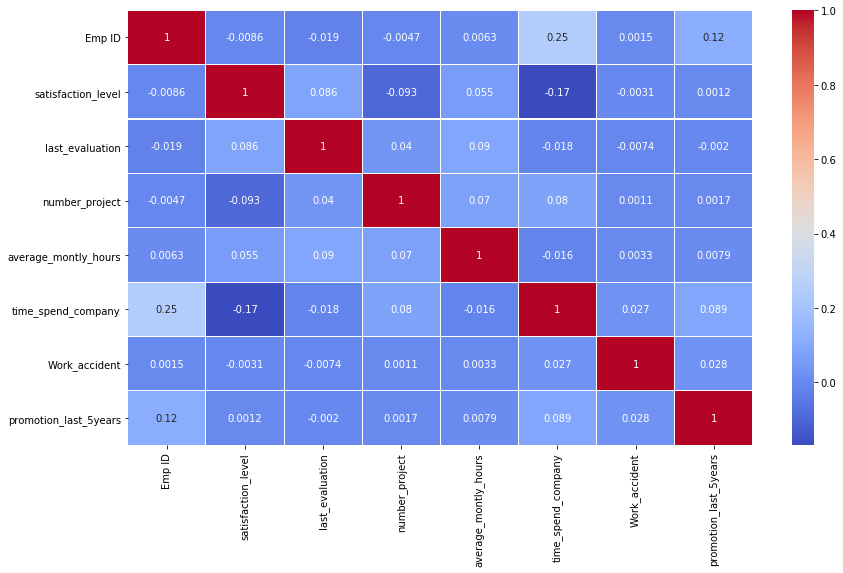

In [18]:
#Co-relation
plt.figure(figsize=(14,8))
sns.heatmap(df1.corr(), annot = True, cmap='coolwarm',linewidths=.1)
plt.show()

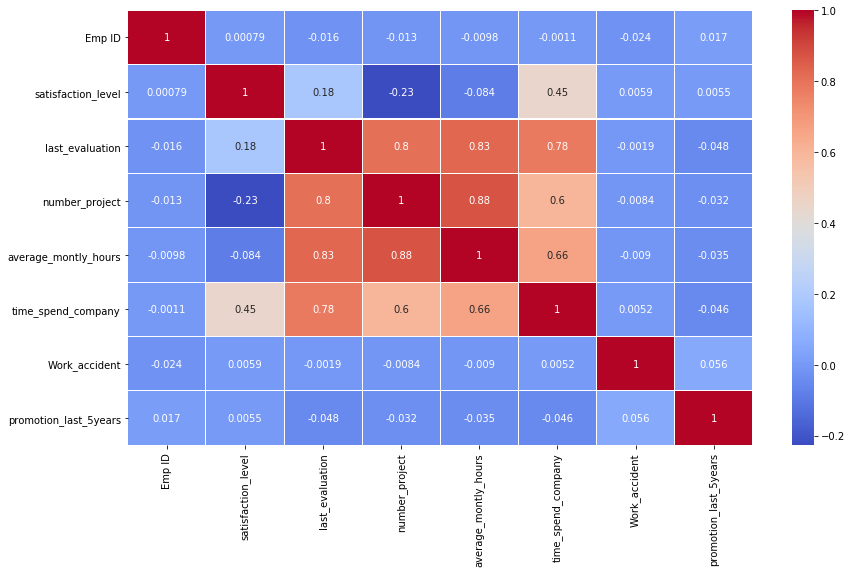

In [19]:
plt.figure(figsize=(14,8))
sns.heatmap(df2.corr(), annot = True, cmap='coolwarm',linewidths=.1)
plt.show()

In [20]:
df1['Employment_status'] = 'yes'

In [21]:
df1.head()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dept,salary,Employment_status
0,2001,0.58,0.74,4,215,3,0,0,sales,low,yes
1,2002,0.82,0.67,2,202,3,0,0,sales,low,yes
2,2003,0.45,0.69,5,193,3,0,0,sales,low,yes
3,2004,0.78,0.82,5,247,3,0,0,sales,low,yes
4,2005,0.49,0.60,3,214,2,0,0,sales,low,yes


In [22]:
df2['Employment_status'] = 'no'

In [23]:
df2.head()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dept,salary,Employment_status
0,1,0.38,0.53,2,157,3,0,0,sales,low,no
1,2,0.80,0.86,5,262,6,0,0,sales,medium,no
2,3,0.11,0.88,7,272,4,0,0,sales,medium,no
3,4,0.72,0.87,5,223,5,0,0,sales,low,no
4,5,0.37,0.52,2,159,3,0,0,sales,low,no


In [24]:
#Combined 2 data frames
dataset = pd.concat([df1, df2])

In [25]:
dataset.head()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dept,salary,Employment_status
0,2001,0.58,0.74,4,215,3,0,0,sales,low,yes
1,2002,0.82,0.67,2,202,3,0,0,sales,low,yes
2,2003,0.45,0.69,5,193,3,0,0,sales,low,yes
3,2004,0.78,0.82,5,247,3,0,0,sales,low,yes
4,2005,0.49,0.60,3,214,2,0,0,sales,low,yes


In [26]:
dataset.to_csv("final.csv", index=False)

## Data Visualisation

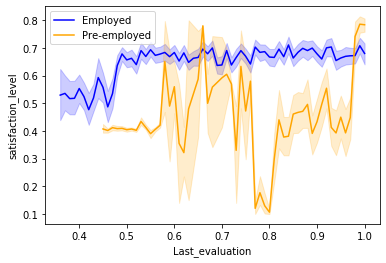

In [27]:
sns.lineplot(x=dataset.last_evaluation[dataset.Employment_status=='yes'], y=dataset.satisfaction_level[(dataset.Employment_status=='yes')], c="blue")
sns.lineplot(x=dataset.last_evaluation[dataset.Employment_status=='no'], y=dataset.satisfaction_level[(dataset.Employment_status=='no')], c="orange")
plt.legend(["Employed", "Pre-employed"])
plt.xlabel("Last_evaluation")
plt.ylabel("satisfaction_level")
plt.show()

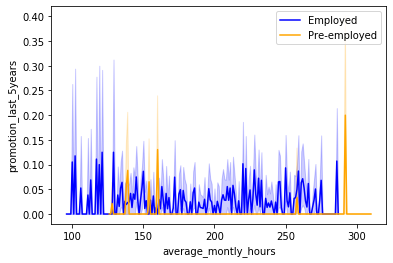

In [28]:
sns.lineplot(x=dataset.average_montly_hours[dataset.Employment_status=='yes'], y=dataset.promotion_last_5years[(dataset.Employment_status=='yes')], c="blue")
sns.lineplot(x=dataset.average_montly_hours[dataset.Employment_status=='no'], y=dataset.promotion_last_5years[(dataset.Employment_status=='no')], c="orange")
plt.legend(["Employed", "Pre-employed"])
plt.xlabel("average_montly_hours")
plt.ylabel("promotion_last_5years")
plt.show()

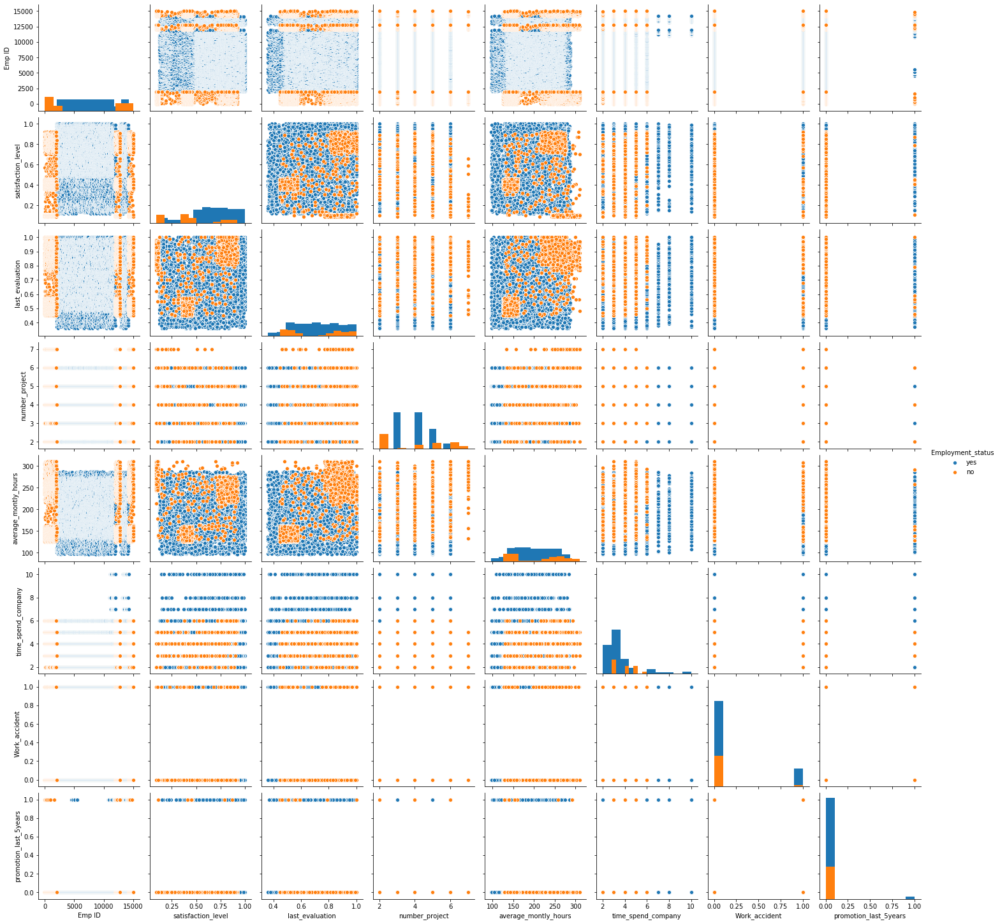

In [29]:
sns.pairplot(dataset, hue="Employment_status", diag_kind= 'hist')

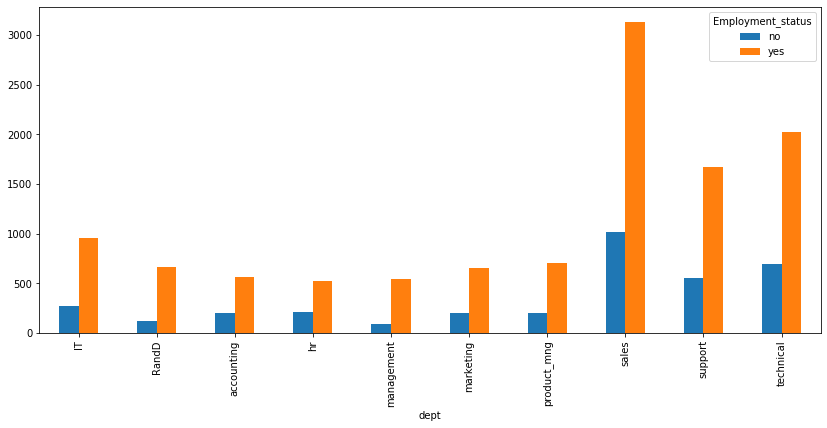

In [30]:
pd.crosstab(dataset.dept,dataset.Employment_status).plot(kind="bar",figsize=(14,6))

In [31]:
# Reassign target
dataset.Employment_status.replace(to_replace = dict(yes = 1, no = 0), inplace = True)

In [32]:
dataset

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dept,salary,Employment_status
0,2001,0.58,0.74,4,215,3,0,0,sales,low,1
1,2002,0.82,0.67,2,202,3,0,0,sales,low,1
2,2003,0.45,0.69,5,193,3,0,0,sales,low,1
3,2004,0.78,0.82,5,247,3,0,0,sales,low,1
4,2005,0.49,0.60,3,214,2,0,0,sales,low,1
...,...,...,...,...,...,...,...,...,...,...,...
3566,14995,0.40,0.57,2,151,3,0,0,support,low,0
3567,14996,0.37,0.48,2,160,3,0,0,support,low,0
3568,14997,0.37,0.53,2,143,3,0,0,support,low,0
3569,14998,0.11,0.96,6,280,4,0,0,support,low,0


In [33]:
import plotly.graph_objs as go
employed = dataset[(dataset['Employment_status'] != 0)]
pre_employed = dataset[(dataset['Employment_status'] == 0)]

#------------COUNT-----------------------
trace = go.Bar(x = (len(employed), len(pre_employed)), y = ['Yes_employed', 'Pre_employed'], orientation = 'h', opacity = 0.8, marker=dict(
        color=['gold', 'lightskyblue'],
        line=dict(color='#000000',width=1.5)))

layout = dict(title =  'Count of employment status variable')
                    
fig = dict(data = [trace], layout=layout)
py.iplot(fig)

#------------PERCENTAGE-------------------
trace = go.Pie(labels = ['Yes_employed', 'Pre_employed'], values = dataset['Employment_status'].value_counts(), 
               textfont=dict(size=15), opacity = 0.8,
               marker=dict(colors=['lightskyblue','gold'], 
                           line=dict(color='#000000', width=1.5)))
layout = dict(title =  'Distribution of attrition variable')
fig = dict(data = [trace], layout=layout)
py.iplot(fig)



In [34]:
def plot_distribution(var_select, bin_size) : 
# Calculate the correlation coefficient between the new variable and the target
    corr = dataset['Employment_status'].corr(dataset[var_select])
    corr = np.round(corr,3)
    tmp1 = employed[var_select]
    tmp2 = pre_employed[var_select]
    hist_data = [tmp1, tmp2]
    
    group_labels = ['Yes_employed', 'Pre_employed']
    colors = ['#FFD700', '#7EC0EE']

    fig = ff.create_distplot(hist_data, group_labels, colors = colors, show_hist = True, curve_type='kde', bin_size = bin_size)
    
    fig['layout'].update(title = var_select+' '+'(corr target ='+ str(corr)+')')

    py.iplot(fig, filename = 'Density plot')

In [35]:
def barplot(var_select, x_no_numeric) :
    tmp1 = dataset[(dataset['Employment_status'] != 0)]
    tmp2 = dataset[(dataset['Employment_status'] == 0)]
    tmp3 = pd.DataFrame(pd.crosstab(dataset[var_select],dataset['Employment_status']), )
    tmp3['Attr%'] = tmp3[1] / (tmp3[1] + tmp3[0]) * 100
    if x_no_numeric == True  : 
        tmp3 = tmp3.sort_values(1, ascending = False)

    color=['lightskyblue','gold' ]
    trace1 = go.Bar(
        x=tmp1[var_select].value_counts().keys().tolist(),
        y=tmp1[var_select].value_counts().values.tolist(),
        name='Employed',opacity = 0.8, marker=dict(
        color='gold',
        line=dict(color='#000000',width=1)))

    
    trace2 = go.Bar(
        x=tmp2[var_select].value_counts().keys().tolist(),
        y=tmp2[var_select].value_counts().values.tolist(),
        name='Pre-Employed', opacity = 0.8, marker=dict(
        color='lightskyblue',
        line=dict(color='#000000',width=1)))
    
    trace3 =  go.Scatter(   
        x=tmp3.index,
        y=tmp3['Attr%'],
        yaxis = 'y2',
        name='% Employement', opacity = 0.6, marker=dict(
        color='black',
        line=dict(color='#000000',width=0.5
        )))

    layout = dict(title =  str(var_select),
              xaxis=dict(), 
              yaxis=dict(title= 'Count'), 
              yaxis2=dict(range= [-0, 75], 
                          overlaying= 'y', 
                          anchor= 'x', 
                          side= 'right',
                          zeroline=False,
                          showgrid= False, 
                          title= '% Employment'
                         ))

    fig = go.Figure(data=[trace1, trace2, trace3], layout=layout)
    py.iplot(fig)
    

In [36]:
# 'satisfaction_level', 'last_evaluation', 'number_project','average_montly_hours', 'time_spend_company', 'Work_accident'
#'promotion_last_5years', 'dept', 'salary'
plot_distribution('satisfaction_level', False)
barplot('satisfaction_level', False)


In [37]:
barplot('last_evaluation', False)
plot_distribution('last_evaluation', False)


In [38]:
barplot('number_project', False)
plot_distribution('average_montly_hours', False)

plot_distribution('time_spend_company', False)


In [39]:
barplot('Work_accident', False)

In [40]:
barplot('promotion_last_5years',False)

In [41]:
barplot('salary', False) 


In [42]:
def plot_pie(var_select) :
    
    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue', 'lightgrey', 'orange', 'white', 'lightpink']
    trace1 = go.Pie(values  = employed[var_select].value_counts().values.tolist(),
                    labels  = employed[var_select].value_counts().keys().tolist(),
                    textfont=dict(size=15), opacity = 0.8,
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [0,.48]),
                    name    = "Employed",
                    marker  = dict(colors = colors, line = dict(width = 1.5)))
    trace2 = go.Pie(values  = pre_employed[var_select].value_counts().values.tolist(),
                    labels  = pre_employed [var_select].value_counts().keys().tolist(),
                    textfont=dict(size=15), opacity = 0.8,
                    hoverinfo = "label+percent+name",
                    marker  = dict(colors = colors, line = dict(width = 1.5)),
                    domain  = dict(x = [.52,1]),
                    name    = "Pre-Employed" )

    layout = go.Layout(dict(title = var_select + " distribution in employement status ",
                            annotations = [dict(text = "Employed",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .22, y = -0.1),
                                           dict(text = "Pre-Employed",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .8,y = -.1)]))
                                          

    fig  = go.Figure(data = [trace1,trace2],layout = layout)
    py.iplot(fig)

In [43]:
# 'satisfaction_level', 'last_evaluation', 'number_project','average_montly_hours', 'time_spend_company', 'Work_accident'
#'promotion_last_5years', 'dept', 'salary'
plot_pie("number_project")
barplot('number_project',True)

In [44]:
plot_pie('time_spend_company')
barplot('time_spend_company',True)


In [45]:
plot_pie('Work_accident')
barplot('Work_accident',True)


In [46]:
plot_pie('promotion_last_5years')
barplot('promotion_last_5years',True)

In [47]:
plot_pie('dept') 
barplot('dept',True)

In [48]:
plot_pie('salary') 
barplot('salary',True)

In [49]:
dataset.dtypes

Emp ID                     int64
satisfaction_level       float64
last_evaluation          float64
number_project             int64
average_montly_hours       int64
time_spend_company         int64
Work_accident              int64
promotion_last_5years      int64
dept                      object
salary                    object
Employment_status          int64
dtype: object

In [50]:
y = dataset.Employment_status.values
X = dataset.drop(['Employment_status'], axis = 1)

In [51]:
X_model = pd.get_dummies(X)

In [52]:
X_model.head()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,dept_IT,dept_RandD,...,dept_hr,dept_management,dept_marketing,dept_product_mng,dept_sales,dept_support,dept_technical,salary_high,salary_low,salary_medium
0,2001,0.58,0.74,4,215,3,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
1,2002,0.82,0.67,2,202,3,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
2,2003,0.45,0.69,5,193,3,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,2004,0.78,0.82,5,247,3,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
4,2005,0.49,0.60,3,214,2,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0


In [53]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_model,y,test_size = 0.2,random_state=12)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((11999, 21), (3000, 21), (11999,), (3000,))

In [54]:
from sklearn.linear_model import LogisticRegression
lr= LogisticRegression()
print(lr)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


In [55]:
lr.fit(X_train, y_train)
## Predict
pred_train_lr = lr.predict(X_train)
pred_test_lr = lr.predict(X_test)

### Train data accuracy
from sklearn.metrics import accuracy_score
print("Accuracy on train is:", accuracy_score(y_train, pred_train_lr))
      
### Test data accuracy
print("Accuracy on test is:", accuracy_score(y_test, pred_test_lr))

Accuracy on train is: 0.8033169430785899
Accuracy on test is: 0.7886666666666666


In [56]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=50, max_depth=8, min_samples_leaf=4, max_features=0.5, random_state=2018)
rf.fit(X_train, y_train)
features = X_model.columns.values

In [57]:
x, y = (list(x) for x in zip(*sorted(zip(rf.feature_importances_, features), 
                                                            reverse = False)))
trace2 = go.Bar(
    x=X_model ,
    y=y,
    marker=dict(
        color=x,
        colorscale = 'Viridis',
        reversescale = True
    ),
    name='Random Forest Feature importance',
    orientation='h',
)

layout = dict(
    title='Barplot of Feature importances',
     width = 600, height = 1000,
    yaxis=dict(
        showgrid=False,
        showline=False,
        showticklabels=True,
#         domain=[0, 0.85],
    ),
    margin=dict(
    l=300,
),
)

fig1 = go.Figure(data=[trace2])
fig1['layout'].update(layout)
py.iplot(fig1, filename='plots')